# Coherence example
## Some simple code to  understand/choose Magnitude Squared Coherence (MSC) parameters:
### Author: Valentina Ticcinelli, <valentina.ticcinelli@ucb.com>
### Creation date: 1-11-2010  
### Version date: 10-11-2010    

In [1]:
#import pyedflib
import numpy as np
import pandas as pd
import math as mt
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import plotly as py
import csv as csv
import seaborn as sns
import os

Set up a numerical simulation with 2 sinusoidals:
   * one has constant frequency (2.5 Hz)
   * one has time-variable frequency, around 2.5Hz,  that shifts back and forth from the first at a slower sinusoidal rythm
   * a little white noise is added to both
## Keeping the amplitude constant:

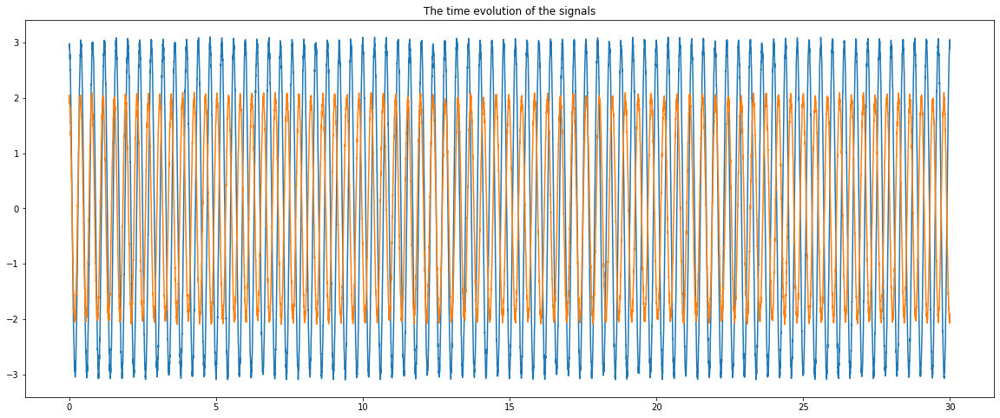

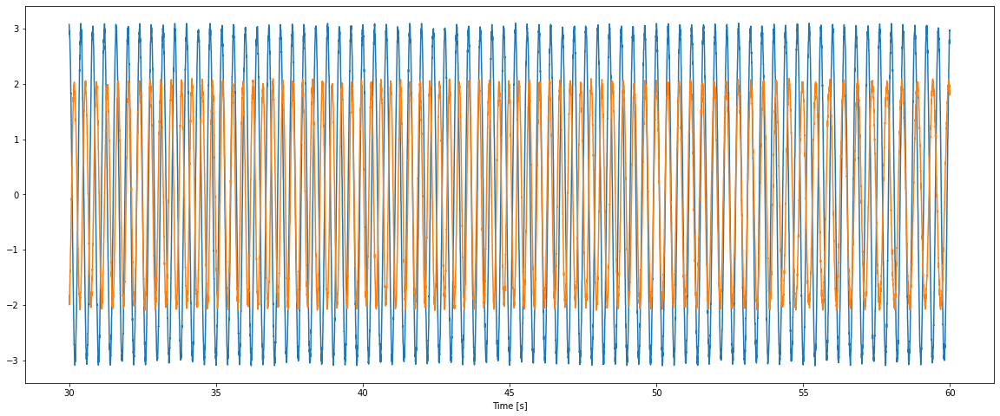

In [2]:
Fs=250
t=np.arange(0,60,1/Fs)
a1=3#+np.sin(0.5*np.pi*t)
a2=2#+np.cos(0.5*np.pi*t)
f1=2.5
f2=2.5+0.1*np.cos(0.05*f1*t)
from numpy.random import rand
noise1=(rand(len(t))-0.5)/5
noise2=(rand(len(t))-0.5)/5
s1=  a1*np.cos(2*np.pi*f1*t)+noise1
s2=  a2*np.cos(2*np.pi*f2*t)+noise2
fig=go.Figure()
fig.add_trace(go.Scatter(x=t, 
                         y=s1, 
                         name='s1',
                         line=dict(color='blue')))     
fig.add_trace(go.Scatter(x=t, 
                         y=s2, 
                         name='s2',
                         line=dict(color='orange')))

fig.update_layout(
    xaxis_title="Time [s]",
    yaxis_title="Amp",
    showlegend=True,
    title='2 signals with white noise and time-variant synchronization')
fig.show()

plt.figure(figsize=(20,8))
plt.plot(t[0:30*250],s1[0:30*250])
plt.plot(t[0:30*250],s2[0:30*250])
plt.title('The time evolution of the signals')
plt.show()

plt.figure(figsize=(20,8))
plt.plot(t[30*250:-1],s1[30*250:-1])
plt.plot(t[30*250:-1],s2[30*250:-1])
plt.xlabel('Time [s]')
plt.show()

Calculate and plot the coherence:
  * calculated on 4s long windows
  * `nfft` is the number of samples used for the FT (has to be less than half of `win`)
  * computation done on sliding window, one every 1sec
  
*Apologies for the missing label on the coherence axes, I am new to python and can't figure out a way to use the actual freq and time vectors as axes for the heatmap. the current numbers are **in this case** a good aproximations of freq (Y) and time [s] (x).  Suggestions welcome =)*

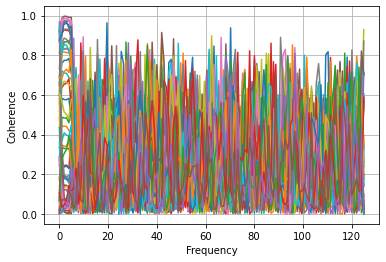

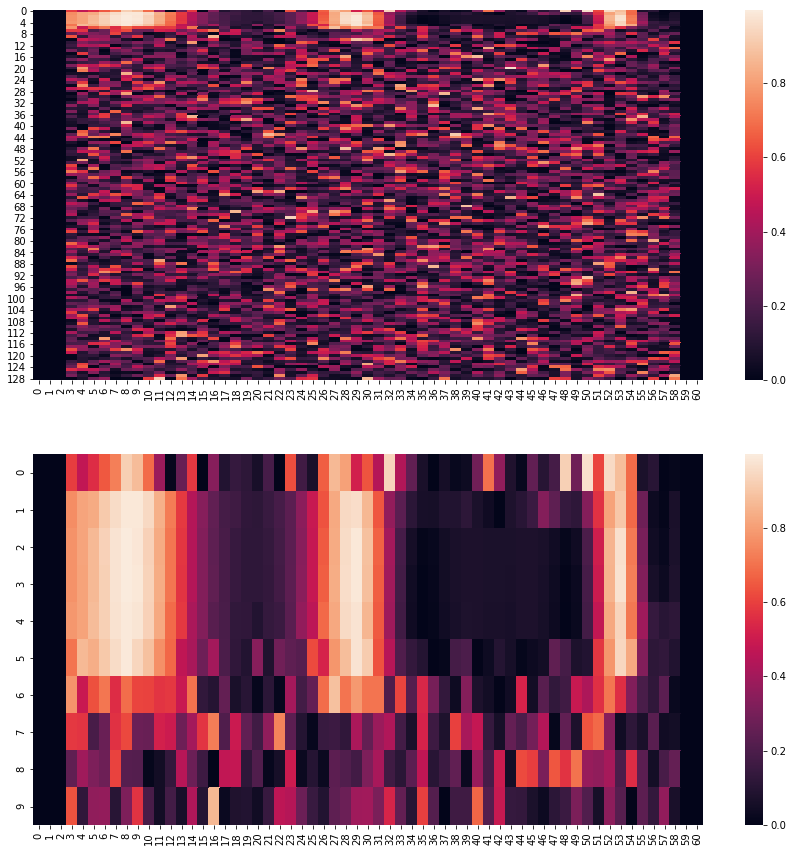

In [3]:
win=  4*Fs
nfft= 256
slide= 1*Fs
coh_mat=[]
             
for i in range(mt.floor(win/2), len(t)-mt.floor(win/2),slide): # one window of length 'win' every 1 seconds
    coh, f_coh =plt.cohere(
                           x=s1[i-mt.floor(win/2):i+mt.floor(win/2)],
                           y=s2[i-mt.floor(win/2):i+mt.floor(win/2)],
                           Fs=Fs,
                           noverlap=mt.floor(nfft/4),
                           NFFT=nfft,
                           )

    coh_mat.append(coh)
#plt.close(ff)
coh_mat=np.array(coh_mat)     
coh_mat=np.concatenate((np.zeros((mt.floor(win/2/Fs)+1,np.shape(coh_mat)[1])), coh_mat ),axis=0)
coh_mat=np.concatenate((coh_mat,np.zeros((mt.floor(win/2/Fs),np.shape(coh_mat)[1])) ),axis=0)
fig, axs = plt.subplots(2,figsize=(15,15))
ax=sns.heatmap(coh_mat.T, ax=axs[0])
ax=sns.heatmap(coh_mat.T[0:10,:], ax=axs[1])

What we can see is that the window with maximal coherence are those where the added cosine has a small value, and the frequency of s2 varies less around the 2.5Hz. Perfect overlapping of the signals (simultaneour phase value) is not needed to have coherence: only constant phase shift. 

# What if the amplitude varies?

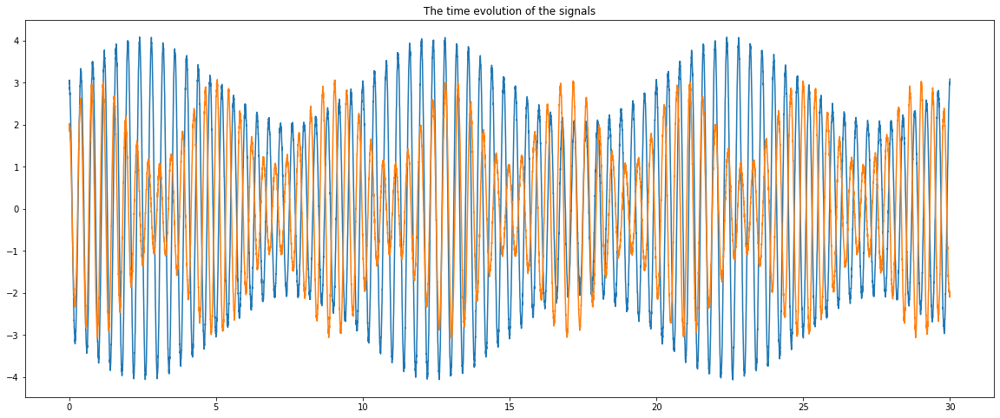

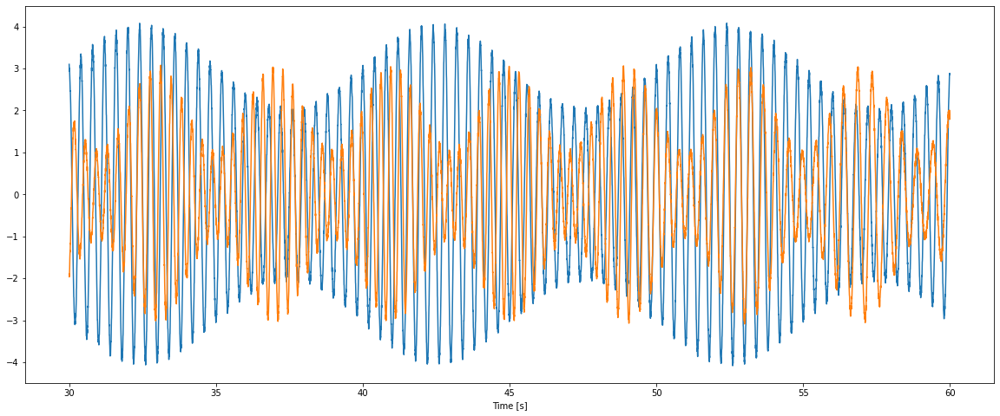

In [6]:
Fs=250
t=np.arange(0,60,1/Fs)
a1= 3+np.sin(2*np.pi*0.1*t)
a2= 2+np.sin(2*np.pi*0.25*t)
f1=2.5
f2=2.5+0.1*np.cos(0.05*f1*t)
from numpy.random import rand
noise1=(rand(len(t))-0.5)/5
noise2=(rand(len(t))-0.5)/5
s1=  a1*np.cos(2*np.pi*f1*t)+noise1
s2=  a2*np.cos(2*np.pi*f2*t)+noise2
fig=go.Figure()
fig.add_trace(go.Scatter(x=t, 
                         y=s1, 
                         name='s1',
                         line=dict(color='blue')))     
fig.add_trace(go.Scatter(x=t, 
                         y=s2, 
                         name='s2',
                         line=dict(color='orange')))

fig.update_layout(
    xaxis_title="Time [s]",
    yaxis_title="Amp",
    showlegend=True,
    title='2 signals with white noise and time-variant synchronization')
fig.show()

plt.figure(figsize=(20,8))
plt.plot(t[0:30*250],s1[0:30*250])
plt.plot(t[0:30*250],s2[0:30*250])
plt.title('The time evolution of the signals')
plt.show()

plt.figure(figsize=(20,8))
plt.plot(t[30*250:-1],s1[30*250:-1])
plt.plot(t[30*250:-1],s2[30*250:-1])
plt.xlabel('Time [s]')
plt.show()

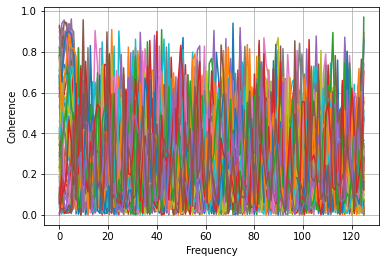

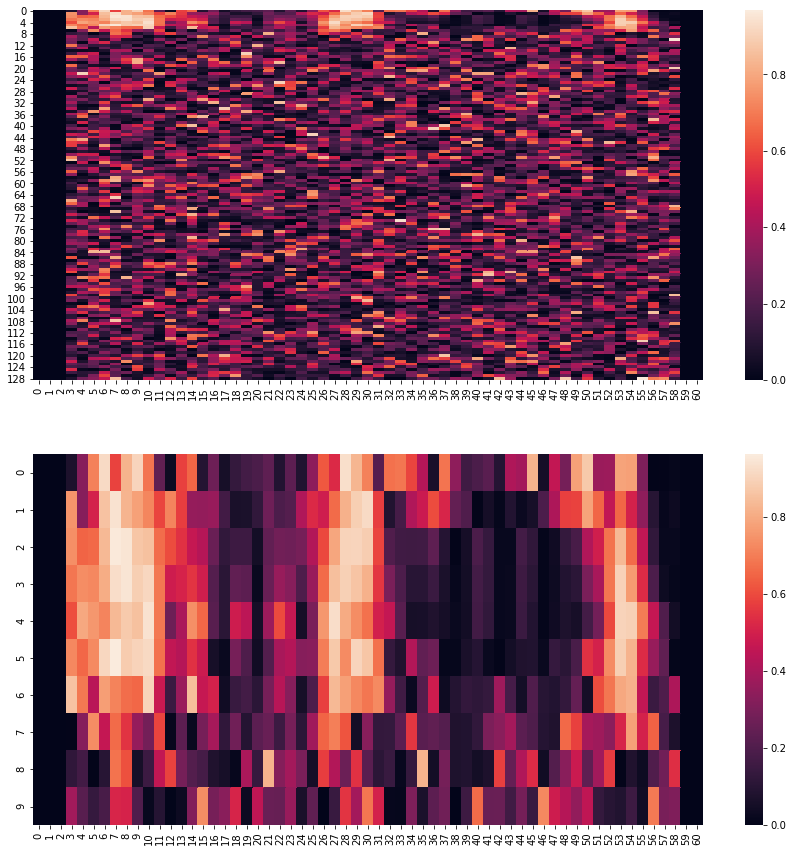

In [7]:
win=  4*Fs
nfft= 256
slide= 1*Fs
coh_mat=[]
             
for i in range(mt.floor(win/2), len(t)-mt.floor(win/2),slide): # one window of length 'win' every 1 seconds
    coh, f_coh =plt.cohere(
                           x=s1[i-mt.floor(win/2):i+mt.floor(win/2)],
                           y=s2[i-mt.floor(win/2):i+mt.floor(win/2)],
                           Fs=Fs,
                           noverlap=mt.floor(nfft/4),
                           NFFT=nfft,
                           )

    coh_mat.append(coh)
#plt.close(ff)
coh_mat=np.array(coh_mat)     
coh_mat=np.concatenate((np.zeros((mt.floor(win/2/Fs)+1,np.shape(coh_mat)[1])), coh_mat ),axis=0)
coh_mat=np.concatenate((coh_mat,np.zeros((mt.floor(win/2/Fs),np.shape(coh_mat)[1])) ),axis=0)
fig, axs = plt.subplots(2,figsize=(15,15))
ax=sns.heatmap(coh_mat.T, ax=axs[0])
ax=sns.heatmap(coh_mat.T[0:10,:], ax=axs[1])

Non-coherent changes in amplitude seem to affect but not majorly influence the MSC measure. Phase coherence is dominant in this measure.